##<b>Problem Statement</b>
Picture this. You are a data scientist in a start-up culture with the potential to have a very large impact on the business. Oh, and you are backed up by a company with 140 years' business experience.

Curious? Great! You are the kind of person we are looking for.

Prudential, one of the largest issuers of life insurance in the USA, is hiring passionate data scientists to join a newly-formed Data Science group solving complex challenges and identifying opportunities. The results have been impressive so far but they want more.

In a one-click shopping world with on-demand everything, the life insurance application process is antiquated. Customers provide extensive information to identify risk classification and eligibility, including scheduling medical exams, a process that takes an average of 30 days.

The result? People are turned off. That’s why only 40% of U.S. households own individual life insurance. Prudential wants to make it quicker and less labor intensive for new and existing customers to get a quote while maintaining privacy boundaries.

By developing a predictive model that accurately classifies risk using a more automated approach, you can greatly impact public perception of the industry.
The results will help Prudential better understand the predictive power of the data points in the existing assessment, enabling them to significantly streamline the process.

##<b>Variable Description</b>

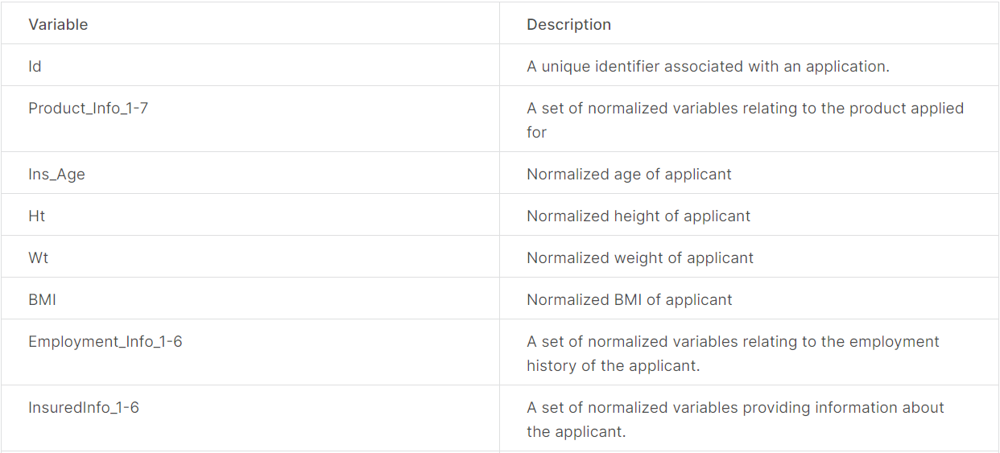

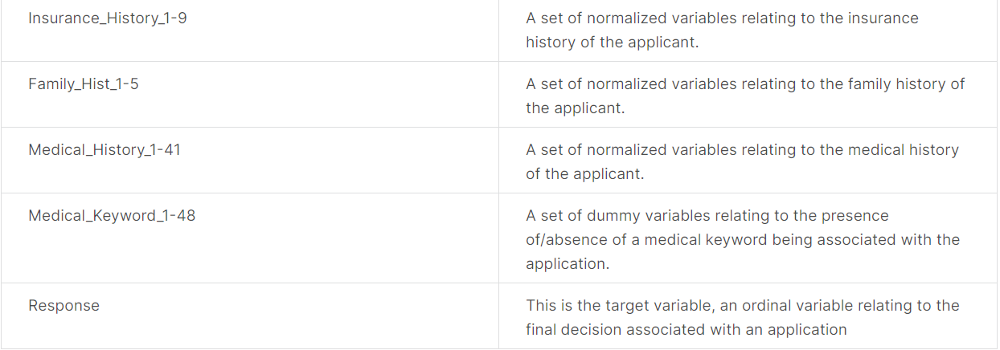

In [1]:
pip install scikit-optimize

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.8/107.8 kB 2.9 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn import ensemble

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
path = '/content/drive/MyDrive/Dataset/Insurance decisioning guided project data/train.csv'
insurance_df = pd.read_csv(path, index_col='Id')

In [5]:
# pd.set_option('display.max_columns', 100) - To display number of columns
# pd.set_option('display.max_rows', None) - To display all the rows
pd.set_option('display.max_columns', None)

In [6]:
insurance_df.head()

,Product_Info_1,Product_Info_2,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,BMI,Employment_Info_1,Employment_Info_2,Employment_Info_3,Employment_Info_4,Employment_Info_5,Employment_Info_6,InsuredInfo_1,InsuredInfo_2,InsuredInfo_3,InsuredInfo_4,InsuredInfo_5,InsuredInfo_6,InsuredInfo_7,Insurance_History_1,Insurance_History_2,Insurance_History_3,Insurance_History_4,Insurance_History_5,Insurance_History_7,Insurance_History_8,Insurance_History_9,Family_Hist_1,Family_Hist_2,Family_Hist_3,Family_Hist_4,Family_Hist_5,Medical_History_1,Medical_History_2,Medical_History_3,Medical_History_4,Medical_History_5,Medical_History_6,Medical_History_7,Medical_History_8,Medical_History_9,Medical_History_10,Medical_History_11,Medical_History_12,Medical_History_13,Medical_History_14,Medical_History_15,Medical_History_16,Medical_History_17,Medical_History_18,Medical_History_19,Medical_History_20,Medical_History_21,Medical_History_22,Medical_History_23,Medical_History_24,Medical_History_25,Medical_History_26,Medical_History_27,Medical_History_28,Medical_History_29,Medical_History_30,Medical_History_31,Medical_History_32,Medical_History_33,Medical_History_34,Medical_History_35,Medical_History_36,Medical_History_37,Medical_History_38,Medical_History_39,Medical_History_40,Medical_History_41,Medical_Keyword_1,Medical_Keyword_2,Medical_Keyword_3,Medical_Keyword_4,Medical_Keyword_5,Medical_Keyword_6,Medical_Keyword_7,Medical_Keyword_8,Medical_Keyword_9,Medical_Keyword_10,Medical_Keyword_11,Medical_Keyword_12,Medical_Keyword_13,Medical_Keyword_14,Medical_Keyword_15,Medical_Keyword_16,Medical_Keyword_17,Medical_Keyword_18,Medical_Keyword_19,Medical_Keyword_20,Medical_Keyword_21,Medical_Keyword_22,Medical_Keyword_23,Medical_Keyword_24,Medical_Keyword_25,Medical_Keyword_26,Medical_Keyword_27,Medical_Keyword_28,Medical_Keyword_29,Medical_Keyword_30,Medical_Keyword_31,Medical_Keyword_32,Medical_Keyword_33,Medical_Keyword_34,Medical_Keyword_35,Medical_Keyword_36,Medical_Keyword_37,Medical_Keyword_38,Medical_Keyword_39,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48,Response
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,1,D3,10,0.076923,2,1,1,0.641791,0.581818,0.148536,0.323008,0.028,12,1,0.0,3,NaN,1,2,6,3,1,2,1,1,1,3,1,0.000667,1,1,2,2,NaN,0.598039,NaN,0.526786,4.0,112,2,1,1,3,2,2,1,NaN,3,2,3,3,240.0,3,3,1,1,2,1,2,3,NaN,1,3,3,1,3,2,3,NaN,1,3,1,2,2,1,3,3,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8
5,1,A1,26,0.076923,2,3,1,0.059701,0.600000,0.131799,0.272288,0.000,1,3,0.0,2,0.0018,1,2,6,3,1,2,1,2,1,3,1,0.000133,1,3,2,2,0.188406,NaN,0.084507,NaN,5.0,412,2,1,1,3,2,2,1,NaN,3,2,3,3,0.0,1,3,1,1,2,1,2,3,NaN,1,3,3,1,3,2,3,NaN,3,1,1,2,2,1,3,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4
6,1,E1,26,0.076923,2,3,1,0.029851,0.745455,0.288703,0.428780,0.030,9,1,0.0,2,0.0300,1,2,8,3,1,1,1,2,1,1,3,NaN,3,2,3,3,0.304348,NaN,0.225352,NaN,10.0,3,2,2,1,3,2,2,2,NaN,3,2,3,3,NaN,1,3,1,1,2,1,2,3,NaN,2,2,3,1,3,2,3,NaN,3,3,1,3,2,1,3,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8
7,1,D4,10,0.487179,2,3,1,0.164179,0.672727,0.205021,0.352438,0.042,9,1,0.0,3,0.2000,2,2,8,3,1,2,1,2,1,1,3,NaN,3,2,3,3,0.420290,NaN,0.352113,NaN,0.0,350,2,2,1,3,2,2,2,NaN,3,2,3,3,NaN,1,3,1,1,2,2,2,3,NaN,1,3,3,1,3,2,3,NaN,3,3,1,2,2,1,3,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8
8,1,D2,26,0.230769,2,3,1,0.417910,0.654545,0.234310,0.424046,0.027,9,1,0.0,2,0.0500,1,2,6,3,1,2,1,2,1,1,3,NaN,3,2,3,2,0.463768,NaN,0.408451,NaN,NaN,162,2,2,1,3,2,2,2,NaN,3,2,3,3,NaN,1,3,1,1,2,1,2,3,NaN,2,2,3,1,3,2,3,NaN,3,3,1,3,2,1,3,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [7]:
insurance_df.shape

(59381, 127)

In [8]:
insurance_df.columns

Index(['Product_Info_1', 'Product_Info_2', 'Product_Info_3', 'Product_Info_4',
       'Product_Info_5', 'Product_Info_6', 'Product_Info_7', 'Ins_Age', 'Ht',
       'Wt',
       ...
       'Medical_Keyword_40', 'Medical_Keyword_41', 'Medical_Keyword_42',
       'Medical_Keyword_43', 'Medical_Keyword_44', 'Medical_Keyword_45',
       'Medical_Keyword_46', 'Medical_Keyword_47', 'Medical_Keyword_48',
       'Response'],
      dtype='object', length=127)

##Exploring the dependent variable

In [9]:
insurance_df['Response'].value_counts()

,count
Response,
8,19489
6,11233
7,8027
2,6552
1,6207
5,5432
4,1428
3,1013


In [10]:
insurance_df['Response'].isnull().sum()

0

<Axes: xlabel='Response', ylabel='count'>

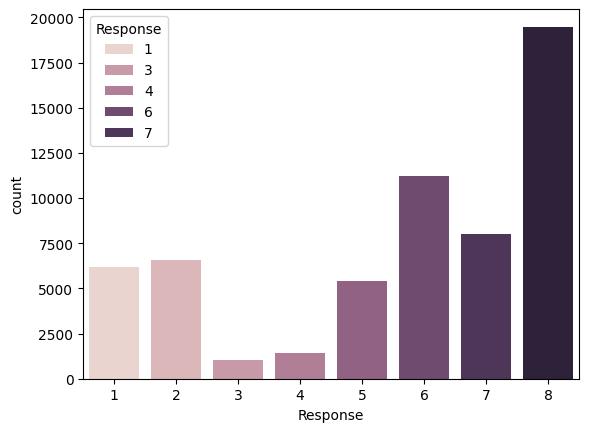

In [11]:
sns.countplot(x='Response', data=insurance_df, hue='Response')

##Converting the dependent variable to binary variable (Two possible labels/classes)

In [12]:
def modified_response(row):
    if ((row['Response'] <= 7) & (row['Response'] >= 0)):
        val = 0
    elif (row['Response'] ==8 ):
        val = 1
    else:
        val = -1

    return val

In [13]:
insurance_df['Modified_Response'] = insurance_df.apply(modified_response, axis=1)

In [14]:
insurance_df['Modified_Response'].value_counts()

,count
Modified_Response,
0,39892
1,19489


<Axes: xlabel='Modified_Response', ylabel='count'>

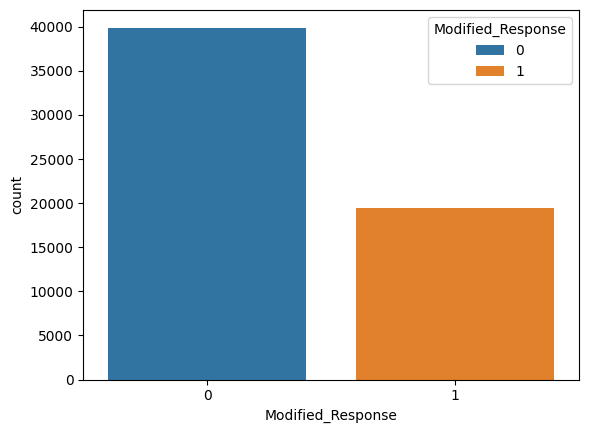

In [15]:
sns.countplot(x='Modified_Response', data=insurance_df, hue='Modified_Response')

In [16]:
insurance_df.drop(['Response'], axis=1, inplace=True)

In [17]:
insurance_df.describe()

,Product_Info_1,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,BMI,Employment_Info_1,Employment_Info_2,Employment_Info_3,Employment_Info_4,Employment_Info_5,Employment_Info_6,InsuredInfo_1,InsuredInfo_2,InsuredInfo_3,InsuredInfo_4,InsuredInfo_5,InsuredInfo_6,InsuredInfo_7,Insurance_History_1,Insurance_History_2,Insurance_History_3,Insurance_History_4,Insurance_History_5,Insurance_History_7,Insurance_History_8,Insurance_History_9,Family_Hist_1,Family_Hist_2,Family_Hist_3,Family_Hist_4,Family_Hist_5,Medical_History_1,Medical_History_2,Medical_History_3,Medical_History_4,Medical_History_5,Medical_History_6,Medical_History_7,Medical_History_8,Medical_History_9,Medical_History_10,Medical_History_11,Medical_History_12,Medical_History_13,Medical_History_14,Medical_History_15,Medical_History_16,Medical_History_17,Medical_History_18,Medical_History_19,Medical_History_20,Medical_History_21,Medical_History_22,Medical_History_23,Medical_History_24,Medical_History_25,Medical_History_26,Medical_History_27,Medical_History_28,Medical_History_29,Medical_History_30,Medical_History_31,Medical_History_32,Medical_History_33,Medical_History_34,Medical_History_35,Medical_History_36,Medical_History_37,Medical_History_38,Medical_History_39,Medical_History_40,Medical_History_41,Medical_Keyword_1,Medical_Keyword_2,Medical_Keyword_3,Medical_Keyword_4,Medical_Keyword_5,Medical_Keyword_6,Medical_Keyword_7,Medical_Keyword_8,Medical_Keyword_9,Medical_Keyword_10,Medical_Keyword_11,Medical_Keyword_12,Medical_Keyword_13,Medical_Keyword_14,Medical_Keyword_15,Medical_Keyword_16,Medical_Keyword_17,Medical_Keyword_18,Medical_Keyword_19,Medical_Keyword_20,Medical_Keyword_21,Medical_Keyword_22,Medical_Keyword_23,Medical_Keyword_24,Medical_Keyword_25,Medical_Keyword_26,Medical_Keyword_27,Medical_Keyword_28,Medical_Keyword_29,Medical_Keyword_30,Medical_Keyword_31,Medical_Keyword_32,Medical_Keyword_33,Medical_Keyword_34,Medical_Keyword_35,Medical_Keyword_36,Medical_Keyword_37,Medical_Keyword_38,Medical_Keyword_39,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48,Modified_Response
count,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59362.000000,59381.000000,59381.000000,52602.000000,59381.000000,48527.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,33985.000000,59381.000000,59381.000000,59381.000000,59381.000000,30725.000000,25140.000000,40197.000000,17570.000000,50492.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,557.000000,59381.000000,59381.000000,59381.000000,59381.000000,14785.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,3801.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,1107.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000,59381.000000
mean,1.026355,24.415655,0.328952,2.006955,2.673599,1.043583,0.405567,0.707283,0.292587,0.469462,0.077582,8.641821,1.300904,0

Product_Info_2 is a string variable and Product_Info_4 is a continuous variable and all other Product_info columns are categorical.

Employment_Info_1,4, and 6 are continuous and rest of the Employment_Info are categorical.

All Insurance_history except Insurance_history_5 are categorical, Insurance_history_5 is a continuous variable.

Insurance_age, Height, weight and BMI are continuous variables.

Medical_History_Info 1, 10, 15, 24 and 32 are discrete variables while other Medical_History_Info are categorical.

All family history are categorical except 2,3,4 and 5 which are continuous variables.

In [18]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows',200)

In [19]:
insurance_df.corr(numeric_only=True)

,Product_Info_1,Product_Info_3,Product_Info_4,Product_Info_5,Product_Info_6,Product_Info_7,Ins_Age,Ht,Wt,BMI,Employment_Info_1,Employment_Info_2,Employment_Info_3,Employment_Info_4,Employment_Info_5,Employment_Info_6,InsuredInfo_1,InsuredInfo_2,InsuredInfo_3,InsuredInfo_4,InsuredInfo_5,InsuredInfo_6,InsuredInfo_7,Insurance_History_1,Insurance_History_2,Insurance_History_3,Insurance_History_4,Insurance_History_5,Insurance_History_7,Insurance_History_8,Insurance_History_9,Family_Hist_1,Family_Hist_2,Family_Hist_3,Family_Hist_4,Family_Hist_5,Medical_History_1,Medical_History_2,Medical_History_3,Medical_History_4,Medical_History_5,Medical_History_6,Medical_History_7,Medical_History_8,Medical_History_9,Medical_History_10,Medical_History_11,Medical_History_12,Medical_History_13,Medical_History_14,Medical_History_15,Medical_History_16,Medical_History_17,Medical_History_18,Medical_History_19,Medical_History_20,Medical_History_21,Medical_History_22,Medical_History_23,Medical_History_24,Medical_History_25,Medical_History_26,Medical_History_27,Medical_History_28,Medical_History_29,Medical_History_30,Medical_History_31,Medical_History_32,Medical_History_33,Medical_History_34,Medical_History_35,Medical_History_36,Medical_History_37,Medical_History_38,Medical_History_39,Medical_History_40,Medical_History_41,Medical_Keyword_1,Medical_Keyword_2,Medical_Keyword_3,Medical_Keyword_4,Medical_Keyword_5,Medical_Keyword_6,Medical_Keyword_7,Medical_Keyword_8,Medical_Keyword_9,Medical_Keyword_10,Medical_Keyword_11,Medical_Keyword_12,Medical_Keyword_13,Medical_Keyword_14,Medical_Keyword_15,Medical_Keyword_16,Medical_Keyword_17,Medical_Keyword_18,Medical_Keyword_19,Medical_Keyword_20,Medical_Keyword_21,Medical_Keyword_22,Medical_Keyword_23,Medical_Keyword_24,Medical_Keyword_25,Medical_Keyword_26,Medical_Keyword_27,Medical_Keyword_28,Medical_Keyword_29,Medical_Keyword_30,Medical_Keyword_31,Medical_Keyword_32,Medical_Keyword_33,Medical_Keyword_34,Medical_Keyword_35,Medical_Keyword_36,Medical_Keyword_37,Medical_Keyword_38,Medical_Keyword_39,Medical_Keyword_40,Medical_Keyword_41,Medical_Keyword_42,Medical_Keyword_43,Medical_Keyword_44,Medical_Keyword_45,Medical_Keyword_46,Medical_Keyword_47,Medical_Keyword_48,Modified_Response
Product_Info_1,1.000000,0.027573,0.059829,0.069720,-0.078684,0.012169,-0.077429,0.052720,-0.004035,-0.037130,0.047371,0.032271,-0.039832,0.008507,-0.018840,0.011871,-0.041654,0.002911,0.002709,-0.047523,0.013376,-0.047975,0.011357,0.013058,0.007242,-0.008187,0.015076,0.010613,0.006753,0.012547,0.008191,-0.001294,-0.054089,-0.017769,-0.056415,-0.013988,0.022124,0.005200,-0.017654,-0.022528,0.005489,0.008830,-0.000740,-0.002164,0.002007,-0.155339,-0.001493,-0.004357,0.007037,0.003845,-0.030431,0.006451,0.004598,0.001497,-0.009154,0.008965,0.001156,-0.004913,0.034479,-0.020301,-0.020741,0.022710,0.012216,-0.009307,0.004215,-0.007327,-0.007955,0.040738,-0.055632,-0.024576,-0.005298,-0.025444,-0.008999,0.012726,0.022837,-0.004703,0.015176,-0.013485,0.003356,-0.021427,-0.008578,0.005124,-0.001615,0.019955,0.000738,-0.005704,-0.002277,0.010436,0.004590,-0.001816,0.000856,-0.036699,-0.002719,-0.000372,0.008864,-0.007173,0.004998,0.007143,0.001019,0.055918,-0.001985,-0.018417,0.004536,-0.005395,-0.004660,-0.008189,-0.008202,-0.008154,0.002827,-0.006149,0.001988,-0.003620,-0.004441,0.007081,-0.007272,0.002378,-0.002782,0.004495,-0.007697,-0.014055,-0.008247,-0.006719,-0.010638,0.004402,-0.008469,-0.019621
Product_Info_3,0.027573,1.000000,0.048775,0.025419,-0.018855,0.015581,0.001005,0.293546,0.213546,0.083288,0.151442,0.191771,-0.241939,-0.026332,-0.764707,-0.005204,-0.033652,0.019398,-0.004991,-0.056197,0.026939,-0.398228,0.029694,0.009949,0.010795,0.033448,-0.022591,0.020219,-0.038518,0.038793,-0.032734,0.020843,-0.010492,0.010921,-0.001724,0.006095,0.009945,-0.033661,-0.041289,-0.090907,-0.004510,-0.045986,-0.005644,-0.006406,0.027212,0.024096,0.005088,-0.001422,0.055416,0.004776,-0.015096,0.009401,-0.003260,-0.018012,-0.071991,0.046969,-0.0

###Dropping the columns with more than 40% null values

In [20]:
missing_val_count_by_col = insurance_df.isnull().sum()/len(insurance_df)

In [21]:
print(missing_val_count_by_col[missing_val_count_by_col > 0.4].sort_values(ascending=False))

Medical_History_10     0.990620
Medical_History_32     0.981358
Medical_History_24     0.935990
Medical_History_15     0.751015
Family_Hist_5          0.704114
Family_Hist_3          0.576632
Family_Hist_2          0.482579
Insurance_History_5    0.427679
dtype: float64


In [22]:
insurance_df = insurance_df.dropna(thresh=insurance_df.shape[0]*0.4, axis=1)

In [23]:
insurance_df.shape

(59381, 122)

In [24]:
insurance_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 59381 entries, 2 to 79146
Columns: 122 entries, Product_Info_1 to Modified_Response
dtypes: float64(13), int64(108), object(1)
memory usage: 55.7+ MB


In [25]:
insurance_df['Product_Info_2'].head(20)

,Product_Info_2
Id,
2,D3
5,A1
6,E1
7,D4
8,D2
10,D2
11,A8
14,D2
15,D3


In [26]:
insurance_df['Product_Info_2'].value_counts()

,count
Product_Info_2,
D3,14321
D4,10812
A8,6835
D1,6554
D2,6286
E1,2647
A1,2363
A6,2098
A2,1974


Drorpping the categorical variable since it has a lot of categories

In [27]:
insurance_df.drop('Product_Info_2', axis=1, inplace=True)

In [28]:
# Data for all the independent variables
X = insurance_df.drop(labels='Modified_Response', axis=1)

# Data for dependent variable
y = insurance_df['Modified_Response']

In [29]:
X = X.fillna(X.mean())

In [30]:
X.shape, y.shape

((59381, 120), (59381,))

###Splitting the data into train and test

In [31]:
# Train-Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=1)

In [32]:
# Checking the shape of train dataset
print(X_train.shape, y_train.shape)

# Checking the shape of test dataset
print(X_test.shape, y_test.shape)

(44535, 120) (44535,)
(14846, 120) (14846,)


**Now we will implement 3 models on our dataset:**

1. **Logistic Regression**
2. **Random Forrest**
3. **XGBoost**

**We will be using three search algorithms for each :**

1. **GridSearchCV**
2. **RandomSearchCV**
3. **BayesianSearchCV**

In [33]:
from sklearn.linear_model import LogisticRegression

In [34]:
from sklearn.metrics import accuracy_score,confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

##Logistic Regression

In [35]:
lr = LogisticRegression()

In [36]:
param_dict_lr = {
    'C' : [1e-6,1e-5,1e-4,1e-3,1e-2,1e-1,1,10,100,1e-3,1e+4,1e+5,1e+6]
}

In [37]:
# GridSearchCV
lr_grid = GridSearchCV(estimator=lr,
                       param_grid = param_dict_lr,
                       cv = 5, verbose=2, scoring='roc_auc')
lr_grid.fit(X_train, y_train)

Fitting 5 folds for each of 13 candidates, totalling 65 fits
[CV] END ............................................C=1e-06; total time=   0.9s
[CV] END ............................................C=1e-06; total time=   0.7s
[CV] END ............................................C=1e-06; total time=   0.7s
[CV] END ............................................C=1e-06; total time=   0.8s
[CV] END ............................................C=1e-06; total time=   0.8s
[CV] END ............................................C=1e-05; total time=   2.3s
[CV] END ............................................C=1e-05; total time=   2.2s
[CV] END ............................................C=1e-05; total time=   2.1s
[CV] END ............................................C=1e-05; total time=   1.3s
[CV] END ............................................C=1e-05; total time=   1.4s
[CV] END ...........................................C=0.0001; total time=   1.3s
[CV] END .......................................

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [1e-06, 1e-05, 0.0001, 0.001, 0.01, 0.1, 1, 10,
                               100, 0.001, 10000.0, 100000.0, 1000000.0]},
             scoring='roc_auc', verbose=2)

In [38]:
print('Train ROC-AUC score : ', lr_grid.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', lr_grid.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.7492983047041653
Test ROC-AUC score :  0.7488212313080964


In [39]:
# RandomSearchCV
lr_random = RandomizedSearchCV(estimator=lr,
                       param_distributions = param_dict_lr,
                       cv = 5, verbose=2, scoring='roc_auc')

lr_random.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ...........................................C=0.0001; total time=   2.2s
[CV] END ...........................................C=0.0001; total time=   2.2s
[CV] END ...........................................C=0.0001; total time=   1.5s
[CV] END ...........................................C=0.0001; total time=   1.2s
[CV] END ...........................................C=0.0001; total time=   1.4s
[CV] END ............................................C=1e-06; total time=   0.8s
[CV] END ............................................C=1e-06; total time=   0.7s
[CV] END ............................................C=1e-06; total time=   0.7s
[CV] END ............................................C=1e-06; total time=   0.8s
[CV] END ............................................C=1e-06; total time=   0.7s
[CV] END ................................................C=1; total time=   1.3s
[CV] END .......................................

RandomizedSearchCV(cv=5, estimator=LogisticRegression(),
                   param_distributions={'C': [1e-06, 1e-05, 0.0001, 0.001, 0.01,
                                              0.1, 1, 10, 100, 0.001, 10000.0,
                                              100000.0, 1000000.0]},
                   scoring='roc_auc', verbose=2)

In [40]:
print('Train ROC-AUC score : ', lr_random.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', lr_random.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.7492983047041653
Test ROC-AUC score :  0.7488212313080964


In [41]:
# BayesianSearchCV
lr_bayes = BayesSearchCV(estimator=lr,
                       search_spaces = {'C' : Real(1e-6, 1e+6, prior='log-uniform') },
                       cv = 5, verbose=2, scoring='roc_auc', n_iter=32)

lr_bayes.fit(X_train,y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ...............................C=254561.12635537962; total time=   1.3s
[CV] END ...............................C=254561.12635537962; total time=   1.8s
[CV] END ...............................C=254561.12635537962; total time=   3.3s
[CV] END ...............................C=254561.12635537962; total time=   1.8s
[CV] END ...............................C=254561.12635537962; total time=   1.3s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ...............................C=1995.1130122962809; total time=   1.3s
[CV] END ...............................C=1995.1130122962809; total time=   1.3s
[CV] END ...............................C=1995.1130122962809; total time=   1.4s
[CV] END ...............................C=1995.1130122962809; total time=   1.3s
[CV] END ...............................C=1995.1130122962809; total time=   1.3s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ....

BayesSearchCV(cv=5, estimator=LogisticRegression(), n_iter=32,
              scoring='roc_auc',
              search_spaces={'C': Real(low=1e-06, high=1000000.0, prior='log-uniform', transform='normalize')},
              verbose=2)

In [42]:
lr_bayes.best_estimator_

LogisticRegression(C=0.0044717187075870675)

In [43]:
print('Train ROC-AUC score : ', lr_bayes.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', lr_bayes.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.750488379925901
Test ROC-AUC score :  0.7508419776370739


***For Logistic Regression, the best estimator so far is given by GridSearchCV.***

In [44]:
lr_model = lr_grid.best_estimator_

##Random Forest Classifier

In [45]:
from sklearn.ensemble import RandomForestClassifier

####Providing the range of values for chosen hyperparameters

In [46]:
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict_rf = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

In [47]:
param_dict_rf

{'n_estimators': [50, 80, 100],
 'max_depth': [4, 6, 8],
 'min_samples_split': [50, 100, 150],
 'min_samples_leaf': [40, 50]}

In [48]:
rf = RandomForestClassifier()

In [49]:
# Grid search
rf_grid = GridSearchCV(estimator=rf,
                       param_grid = param_dict_rf,
                       cv = 5, verbose=2, scoring='roc_auc')

rf_grid.fit(X_train,y_train)

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.0s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=50; total time=   1.1s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   2.3s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   2.4s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.7s
[CV] END max_depth=4, min_samples_leaf=40, min_samples_split=50, n_estimators=80; total time=   1.6s
[CV] END max_depth=4, min_sam

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [4, 6, 8], 'min_samples_leaf': [40, 50],
                         'min_samples_split': [50, 100, 150],
                         'n_estimators': [50, 80, 100]},
             scoring='roc_auc', verbose=2)

In [50]:
rf_grid.best_estimator_

RandomForestClassifier(max_depth=8, min_samples_leaf=40, min_samples_split=50)

In [51]:
rf_grid.best_params_

{'max_depth': 8,
 'min_samples_leaf': 40,
 'min_samples_split': 50,
 'n_estimators': 100}

In [52]:
print('Train ROC-AUC score : ', rf_grid.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', rf_grid.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.8097451442685528
Test ROC-AUC score :  0.8021689343931026


In [53]:
# RandomSearchCV
rf_random = RandomizedSearchCV(estimator=rf,
                       param_distributions = param_dict_rf,
                       cv = 5, verbose=2, scoring='roc_auc')

rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   2.0s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   2.7s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   2.7s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   1.9s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=50, n_estimators=100; total time=   2.0s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   1.9s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   1.9s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   2.0s
[CV] END max_depth=4, min_samples_leaf=50, min_samples_split=100, n_estimators=100; total time=   2.9s
[CV] END max_dept

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'max_depth': [4, 6, 8],
                                        'min_samples_leaf': [40, 50],
                                        'min_samples_split': [50, 100, 150],
                                        'n_estimators': [50, 80, 100]},
                   scoring='roc_auc', verbose=2)

In [54]:
rf_random.best_params_

{'n_estimators': 100,
 'min_samples_split': 100,
 'min_samples_leaf': 40,
 'max_depth': 8}

In [55]:
print('Train ROC-AUC score : ', rf_random.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', rf_random.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.8071853598293477
Test ROC-AUC score :  0.7995419641654318


In [56]:
# BayesianSearchCV
rf_bayes = BayesSearchCV(estimator=rf,
                       search_spaces = {
                          'max_depth': Integer(4,8),
                          'min_samples_leaf': Integer(10,100),
                          'min_samples_split': Integer(50,150),
                          'n_estimators': Integer(10,100)
                        },
                       cv = 5, verbose=2, scoring='roc_auc')

rf_bayes.fit(X_train,y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END max_depth=6, min_samples_leaf=67, min_samples_split=105, n_estimators=22; total time=   0.7s
[CV] END max_depth=6, min_samples_leaf=67, min_samples_split=105, n_estimators=22; total time=   0.7s
[CV] END max_depth=6, min_samples_leaf=67, min_samples_split=105, n_estimators=22; total time=   0.7s
[CV] END max_depth=6, min_samples_leaf=67, min_samples_split=105, n_estimators=22; total time=   0.7s
[CV] END max_depth=6, min_samples_leaf=67, min_samples_split=105, n_estimators=22; total time=   0.7s
Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END max_depth=8, min_samples_leaf=22, min_samples_split=125, n_estimators=31; total time=   1.6s
[CV] END max_depth=8, min_samples_leaf=22, min_samples_split=125, n_estimators=31; total time=   1.7s
[CV] END max_depth=8, min_samples_leaf=22, min_samples_split=125, n_estimators=31; total time=   1.5s
[CV] END max_depth=8, min_samples_leaf=22, min_samples_split=125, 

BayesSearchCV(cv=5, estimator=RandomForestClassifier(), scoring='roc_auc',
              search_spaces={'max_depth': Integer(low=4, high=8, prior='uniform', transform='normalize'),
                             'min_samples_leaf': Integer(low=10, high=100, prior='uniform', transform='normalize'),
                             'min_samples_split': Integer(low=50, high=150, prior='uniform', transform='normalize'),
                             'n_estimators': Integer(low=10, high=100, prior='uniform', transform='normalize')},
              verbose=2)

In [57]:
rf_bayes.best_params_

OrderedDict([('max_depth', 8),
             ('min_samples_leaf', 10),
             ('min_samples_split', 150),
             ('n_estimators', 91)])

In [58]:
print('Train ROC-AUC score : ', rf_bayes.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', rf_bayes.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.8061075558549455
Test ROC-AUC score :  0.8003502626970228


***For Random Classifier, the best estimator so far is given by BayesSearchCV.***

In [59]:
rf_model = rf_bayes.best_estimator_

##XG Boost Classifier

In [60]:
from xgboost import XGBClassifier

In [61]:
xgb = XGBClassifier(objective='binary:logistic',nthread=4,seed=42)

param_dict_xgb = {'max_depth': range(2,10,1),
                  'n_estimators': range(60,220,40),
                  'learning_rate': [0.1,0.05,0.01,0.005]}

In [62]:
# GridSearchCV
xgb_grid = GridSearchCV(estimator=xgb,
                       param_grid = param_dict_xgb,
                       cv = 5, verbose=2, scoring='roc_auc')

xgb_grid.fit(X_train,y_train)

Fitting 5 folds for each of 128 candidates, totalling 640 fits
[CV] END ....learning_rate=0.1, max_depth=2, n_estimators=60; total time=   1.0s
[CV] END ....learning_rate=0.1, max_depth=2, n_estimators=60; total time=   1.0s
[CV] END ....learning_rate=0.1, max_depth=2, n_estimators=60; total time=   0.9s
[CV] END ....learning_rate=0.1, max_depth=2, n_estimators=60; total time=   0.9s
[CV] END ....learning_rate=0.1, max_depth=2, n_estimators=60; total time=   1.0s
[CV] END ...learning_rate=0.1, max_depth=2, n_estimators=100; total time=   1.2s
[CV] END ...learning_rate=0.1, max_depth=2, n_estimators=100; total time=   1.1s
[CV] END ...learning_rate=0.1, max_depth=2, n_estimators=100; total time=   1.2s
[CV] END ...learning_rate=0.1, max_depth=2, n_estimators=100; total time=   1.7s
[CV] END ...learning_rate=0.1, max_depth=2, n_estimators=100; total time=   2.1s
[CV] END ...learning_rate=0.1, max_depth=2, n_estimators=140; total time=   2.1s
[CV] END ...learning_rate=0.1, max_depth=2, n_

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, nthread=4,
                                     num_parallel_tree=None, ...),
             param_grid={'learning_rate': [0.1, 0.05, 0.01, 0.005],
                         'max_depth': range(2, 10),
                         'n_estimators': range(60, 220, 40)},
             scoring='roc_auc', verbose=2)

In [63]:
xgb_grid.best_params_

{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 140}

In [64]:
print('Train ROC-AUC score : ', xgb_grid.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', xgb_grid.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.8679465588862693
Test ROC-AUC score :  0.834972383133504


In [65]:
#RandomSearchCV
xgb_random = RandomizedSearchCV(estimator=xgb,
                       param_distributions = param_dict_xgb,
                       cv = 5, verbose=2, scoring='roc_auc')

xgb_random.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END ..learning_rate=0.01, max_depth=4, n_estimators=100; total time=   1.7s
[CV] END ..learning_rate=0.01, max_depth=4, n_estimators=100; total time=   1.6s
[CV] END ..learning_rate=0.01, max_depth=4, n_estimators=100; total time=   1.6s
[CV] END ..learning_rate=0.01, max_depth=4, n_estimators=100; total time=   1.6s
[CV] END ..learning_rate=0.01, max_depth=4, n_estimators=100; total time=   2.6s
[CV] END .learning_rate=0.005, max_depth=7, n_estimators=100; total time=   3.4s
[CV] END .learning_rate=0.005, max_depth=7, n_estimators=100; total time=   2.3s
[CV] END .learning_rate=0.005, max_depth=7, n_estimators=100; total time=   2.3s
[CV] END .learning_rate=0.005, max_depth=7, n_estimators=100; total time=   2.3s
[CV] END .learning_rate=0.005, max_depth=7, n_estimators=100; total time=   2.2s
[CV] END ..learning_rate=0.01, max_depth=2, n_estimators=100; total time=   2.0s
[CV] END ..learning_rate=0.01, max_depth=2, n_es

RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate...
                                           max_cat_to_onehot=None,
                                           max_delta_step=None, max_depth=None,
                                           max_leaves=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_constraints=None,
                                           multi_strategy=None,
                                           n_estimators=None, n_jobs=None,
                                           nthread=4, num_parallel_tree=None, ...),
                   param_distributions={'learning_rate': [0.1, 0.05, 0.01,
                                                          0.005],
                                        'max_depth': range(2, 10),
                                        'n_estimators': range(60, 220, 40)},
                   scoring='roc_auc', verbose=2)

In [66]:
xgb_random.best_params_

{'n_estimators': 180, 'max_depth': 8, 'learning_rate': 0.1}

In [67]:
print('Train ROC-AUC score : ', xgb_random.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', xgb_random.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.8921971483103177
Test ROC-AUC score :  0.8338946517580493


In [68]:
# BayesianSearchCV
xgb_bayes = BayesSearchCV(estimator=xgb,
                       search_spaces = {
                          'max_depth': Integer(2, 10),
                          'n_estimators': Integer(60, 220),
                          'learning_rate': Real(0.001, 0.1, prior='log-uniform')
                        },
                       cv = 5, verbose=2, scoring='roc_auc', n_jobs=10)

xgb_bayes.fit(X_train,y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Fitting 5 folds for each of 1 candidates, totalling 5 fi

BayesSearchCV(cv=5,
              estimator=XGBClassifier(base_score=None, booster=None,
                                      callbacks=None, colsample_bylevel=None,
                                      colsample_bynode=None,
                                      colsample_bytree=None, device=None,
                                      early_stopping_rounds=None,
                                      enable_categorical=False,
                                      eval_metric=None, feature_types=None,
                                      gamma=None, grow_policy=None,
                                      importance_type=None,
                                      interaction_constraints=None,
                                      learning_rate=None...
                                      multi_strategy=None, n_estimators=None,
                                      n_jobs=None, nthread=4,
                                      num_parallel_tree=None, ...),
              n_jobs=10, scoring='roc_auc',
              search_spaces={'learning_rate': Real(low=0.001, high=0.1, prior='log-uniform', transform='normalize'),
                             'max_depth': Integer(low=2, high=10, prior='uniform', transform='normalize'),
                             'n_estimators': Integer(low=60, high=220, prior='uniform', transform='normalize')},
              verbose=2)

In [69]:
xgb_bayes.best_params_

OrderedDict([('learning_rate', 0.1), ('max_depth', 7), ('n_estimators', 151)])

In [70]:
print('Train ROC-AUC score : ', xgb_bayes.best_estimator_.score(X_train,y_train))
print('Test ROC-AUC score : ', xgb_bayes.best_estimator_.score(X_test,y_test))

Train ROC-AUC score :  0.8707757943190749
Test ROC-AUC score :  0.834972383133504


***For XG Boost the best estimator is given by GridSearchCV.***

In [71]:
xgb_model = xgb_grid.best_estimator_

**Collecting all our best models**

In [72]:
models = [lr_model, rf_model, xgb_model]

In [73]:
from sklearn.metrics import roc_auc_score

In [74]:
# Function for KS Statistics
def model_metric(models,X_train, X_test, y_train, y_test):

  cols = ['Train accuracy', 'Test accuracy', 'Train precision', 'Test precision', 'Train recall', 'Test recall',
          'Train f1 score', 'Test f1 score', 'Train ROC-AUC', 'Test ROC-AUC']
  model_df = pd.DataFrame(columns=cols)
  conf_train, conf_test = {}, {}

  i = 0
  for model in models:

    model.fit(X_train, y_train)
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)

    model_df.loc[i,'Train accuracy'] = accuracy_score(y_train, y_pred_train).round(2)
    model_df.loc[i,'Test accuracy'] = accuracy_score( y_test, y_pred_test).round(2)
    model_df.loc[i,'Train precision'] = precision_score(y_train, y_pred_train).round(2)
    model_df.loc[i,'Test precision'] = precision_score( y_test, y_pred_test).round(2)
    model_df.loc[i,'Train recall'] = recall_score(y_train, y_pred_train).round(2)
    model_df.loc[i,'Test recall'] = recall_score(y_test, y_pred_test).round(2)
    model_df.loc[i,'Train f1 score'] = f1_score(y_train, y_pred_train).round(2)
    model_df.loc[i,'Test f1 score'] = f1_score(y_test, y_pred_test).round(2)
    model_df.loc[i,'Train ROC-AUC'] = roc_auc_score(y_train, y_pred_train).round(2)
    model_df.loc[i,'Test ROC-AUC'] = roc_auc_score( y_test, y_pred_test).round(2)

    conf_train[model.__class__.__name__] = confusion_matrix(y_train, y_pred_train)
    conf_test[model.__class__.__name__] = confusion_matrix(y_test, y_pred_test)

    i+=1

  return model_df, conf_train, conf_test

In [75]:
# Print the shapes of X_train and X_test
print("Shape of X_train:", X_train.shape)
print("Shape of X_test:", X_test.shape)

# Print the shapes of y_train and y_test
print("Shape of y_train:", y_train.shape)
print("Shape of y_test:", y_test.shape)

# Ensure y_train and y_test are 1D arrays
y_train = y_train.ravel()
y_test = y_test.ravel()

# Call the model_metric function
model_df, conf_train, conf_test = model_metric(models, X_train, X_test, y_train, y_test)


Shape of X_train: (44535, 120)
Shape of X_test: (14846, 120)
Shape of y_train: (44535,)
Shape of y_test: (14846,)


In [76]:
model_df

,Train accuracy,Test accuracy,Train precision,Test precision,Train recall,Test recall,Train f1 score,Test f1 score,Train ROC-AUC,Test ROC-AUC
0,0.75,0.75,0.63,0.63,0.57,0.56,0.6,0.59,0.7,0.7
1,0.81,0.8,0.77,0.76,0.59,0.58,0.67,0.66,0.75,0.74
2,0.87,0.83,0.78,0.74,0.83,0.76,0.8,0.75,0.86,0.82


It is quite evident from the results that XGBoost is the best model that can be used for the insurance decisioning dataset since all the performance metrics (accuracy, precision, recall and roc-auc score) show a higher value for the XGBoost model !

In [77]:
for key, value in conf_train.items():
  print(f'Confusion matrix for {key} :\n{value}')

Confusion matrix for LogisticRegression :
[[25079  4828]
 [ 6337  8291]]
Confusion matrix for RandomForestClassifier :
[[27329  2578]
 [ 6005  8623]]
Confusion matrix for XGBClassifier :
[[26575  3332]
 [ 2549 12079]]


In [78]:
for key, value in conf_test.items():
  print(f'Confusion matrix for {key} :\n{value}')

Confusion matrix for LogisticRegression :
[[8390 1595]
 [2134 2727]]
Confusion matrix for RandomForestClassifier :
[[9108  877]
 [2061 2800]]
Confusion matrix for XGBClassifier :
[[8685 1300]
 [1150 3711]]


##Feature Importance

In [79]:
!pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 15.6 MB/s eta 0:00:00


In [80]:
import shap
shap.initjs()

###Random Forest Model

In [127]:
explainer_train_rf = shap.TreeExplainer(rf_model)
shap_values_train_rf = explainer_train_rf.shap_values(X_train)

In [128]:
shap_values_train_rf.shape

(44535, 120, 2)

<Figure size 800x950 with 0 Axes>

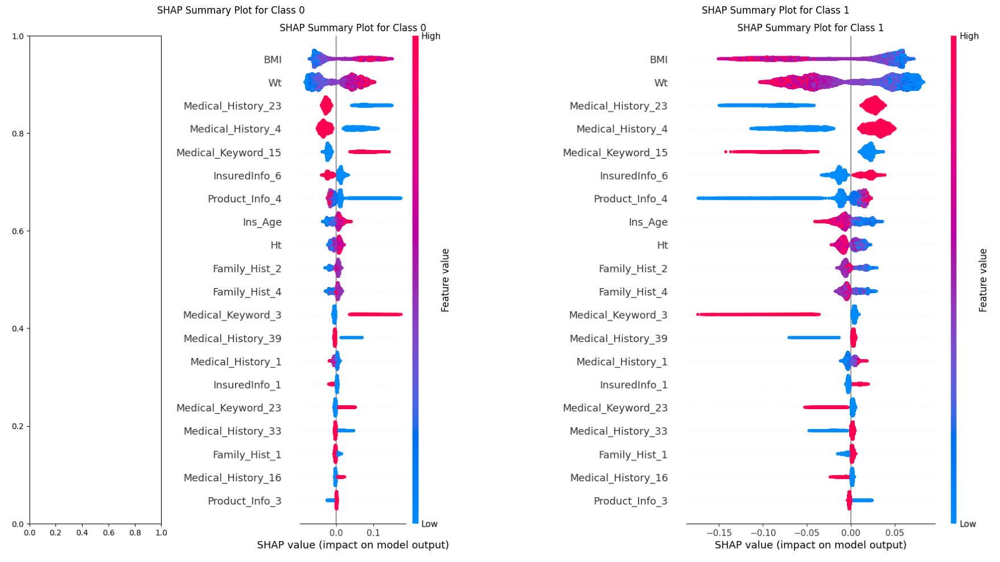

In [147]:

# Select the shap values for the first class (index 0)
shap_values_for_class_0 = shap_values_train_rf[:, :, 0]

# Verify the shape matches
assert shap_values_for_class_0.shape == X_train.shape, "Shapes of shap_values_for_class_0 and X_train do not match!"

# Create a figure to hold the plots
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Generate the SHAP summary plot for the first class
shap.summary_plot(shap_values_for_class_0, X_train, plot_type='dot', show=False)
plt.gca().set_title("SHAP Summary Plot for Class 0")
plt.savefig('shap_class_0.png', bbox_inches='tight')

# Clear the current figure
plt.clf()

# Select the shap values for the second class (index 1)
shap_values_for_class_1 = shap_values_train_rf[:, :, 1]

# Verify the shape matches
assert shap_values_for_class_1.shape == X_train.shape, "Shapes of shap_values_for_class_1 and X_train do not match!"

# Generate the SHAP summary plot for the second class
shap.summary_plot(shap_values_for_class_1, X_train, plot_type='dot', show=False)
plt.gca().set_title("SHAP Summary Plot for Class 1")
plt.savefig('shap_class_1.png', bbox_inches='tight')

# Clear the current figure
plt.clf()

# Load the saved plots
img0 = plt.imread('shap_class_0.png')
img1 = plt.imread('shap_class_1.png')

# Plot the loaded images side by side
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(img0)
axs[0].axis('off')
axs[0].set_title("SHAP Summary Plot for Class 0")
axs[1].imshow(img1)
axs[1].axis('off')
axs[1].set_title("SHAP Summary Plot for Class 1")

# Display the combined plot
plt.tight_layout()
plt.show()


In [130]:
explainer_test_rf = shap.TreeExplainer(rf_model)
shap_values_test_rf = explainer_test_rf.shap_values(X_test)

In [131]:
shap_values_test_rf.shape

(14846, 120, 2)

<Figure size 800x950 with 0 Axes>

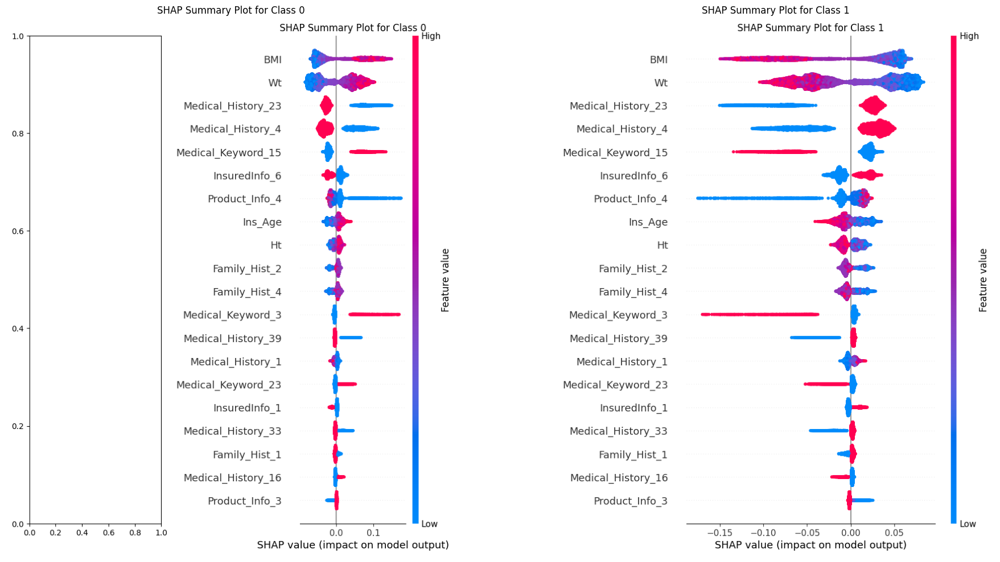

In [148]:

# Selecting the shap values for the first class (index 0)
shap_values_for_class_0 = shap_values_test_rf[:, :, 0]

# Verifying the shape matches
assert shap_values_for_class_0.shape == X_test.shape, "Shapes of shap_values_for_class_0 and X_train do not match!"

# Create a figure to hold the plots
fig, axs = plt.subplots(1, 2, figsize=(20, 10))

# Generating the SHAP summary plot for the first class
shap.summary_plot(shap_values_for_class_0, X_test, plot_type='dot', show=False)
plt.gca().set_title("SHAP Summary Plot for Class 0")
plt.savefig('shap_class_0.png', bbox_inches='tight')

# Clearing the current figure
plt.clf()

# Select the shap values for the second class (index 1)
shap_values_for_class_1 = shap_values_test_rf[:, :, 1]

# Verifying the shape matches
assert shap_values_for_class_1.shape == X_test.shape, "Shapes of shap_values_for_class_1 and X_train do not match!"

# Generating the SHAP summary plot for the second class
shap.summary_plot(shap_values_for_class_1, X_test, plot_type='dot', show=False)
plt.gca().set_title("SHAP Summary Plot for Class 1")
plt.savefig('shap_class_1.png', bbox_inches='tight')

# Clear the current figure
plt.clf()

# Loading the saved plots
img0 = plt.imread('shap_class_0.png')
img1 = plt.imread('shap_class_1.png')

# Plotting the loaded images side by side
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].imshow(img0)
axs[0].axis('off')
axs[0].set_title("SHAP Summary Plot for Class 0")
axs[1].imshow(img1)
axs[1].axis('off')
axs[1].set_title("SHAP Summary Plot for Class 1")

# Displaying the combined plot
plt.tight_layout()
plt.show()


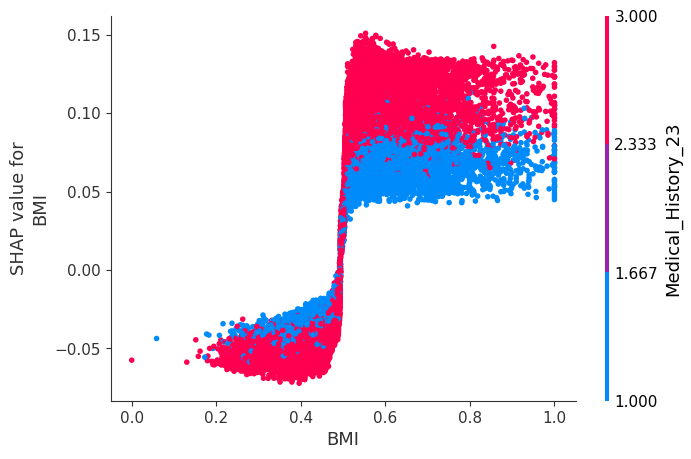

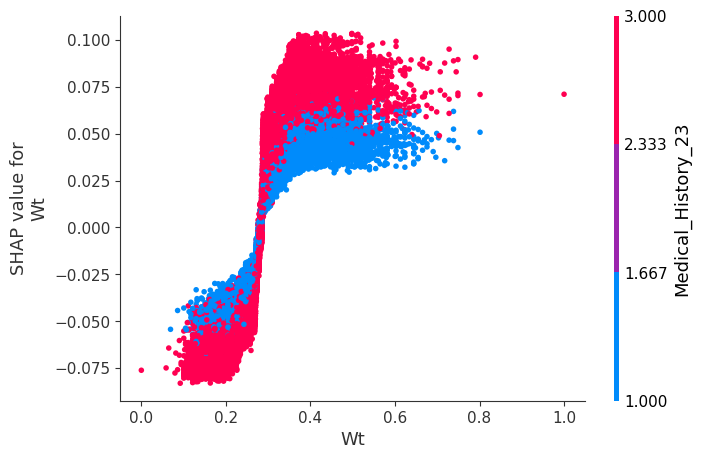

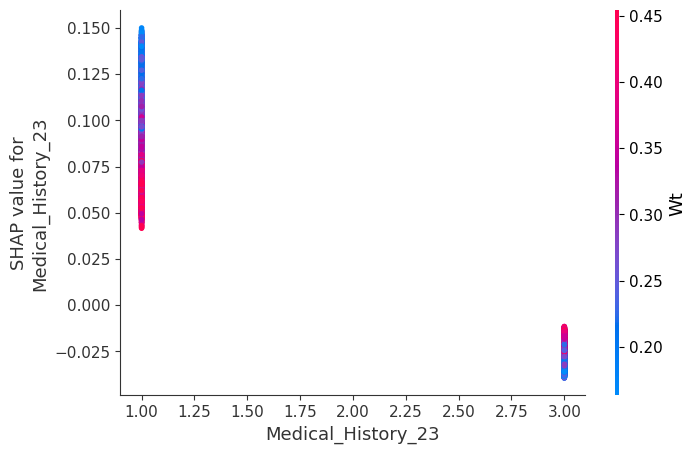

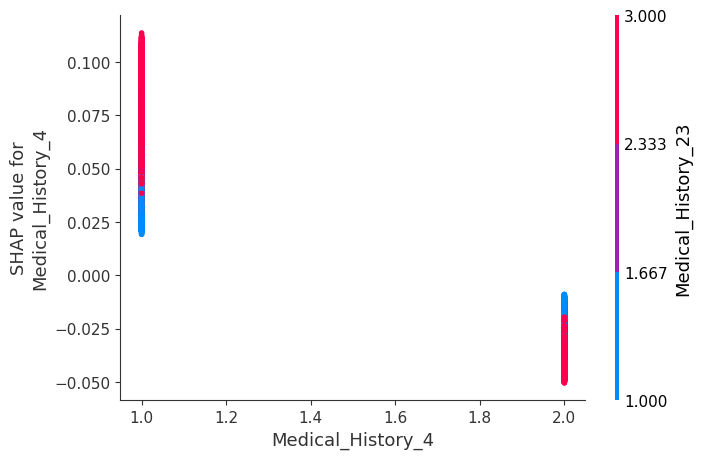

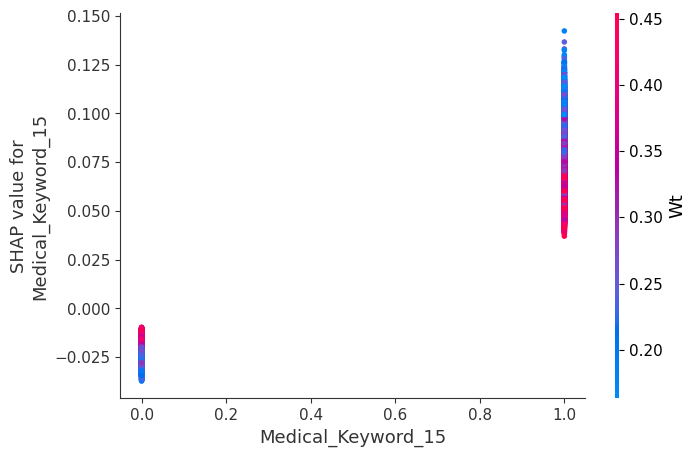

...

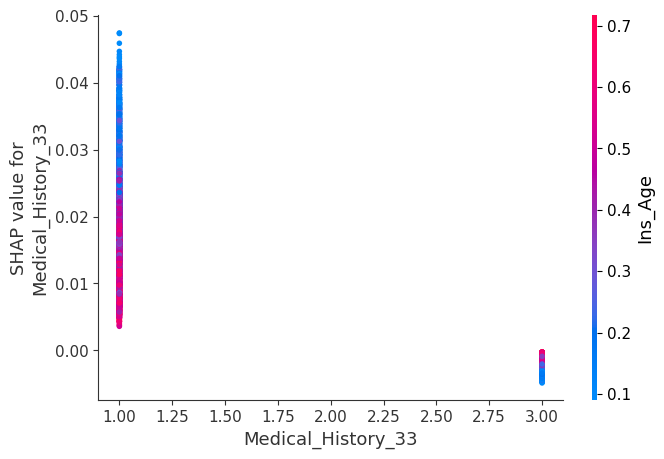

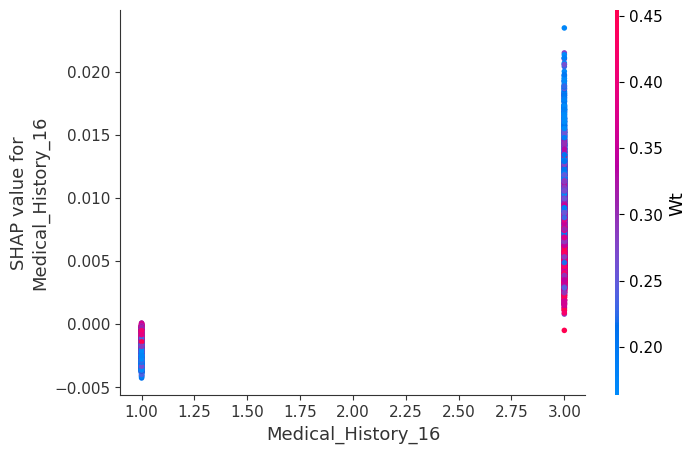

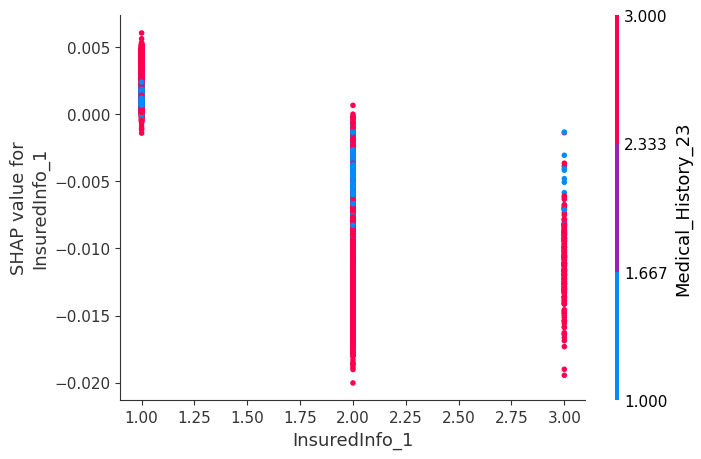

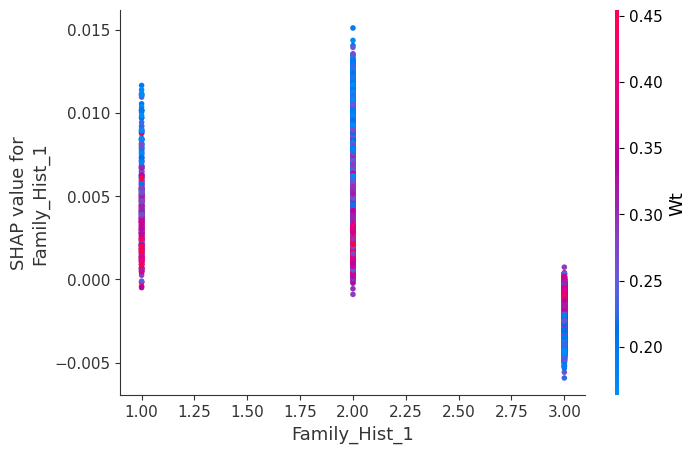

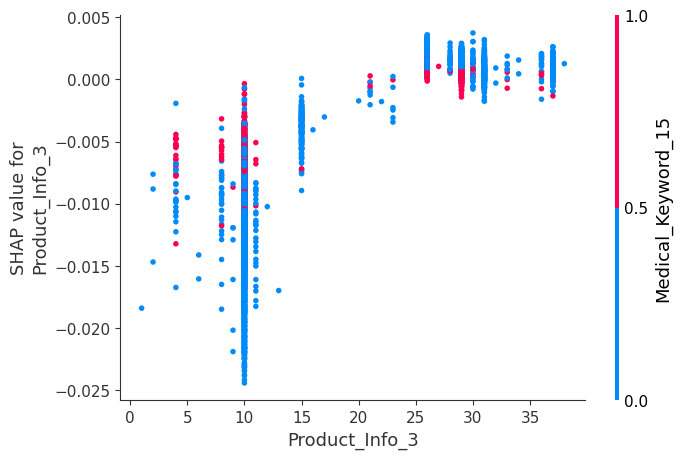

In [159]:
# Ensuring our top variables are in X_train columns
top_vars = ['BMI', 'Wt', 'Medical_History_23', 'Medical_History_4', 'Medical_Keyword_15', 'Product_Info_4',
            'InsuredInfo_6', 'Ins_Age', 'Ht', 'Family_Hist_2', 'Family_Hist_4', 'Medical_Keyword_23',
            'Medical_History_39', 'Medical_History_1', 'Medical_History_33', 'Medical_History_16',
            'InsuredInfo_1', 'Family_Hist_1', 'Product_Info_3']

# Assuming shap_values_train_rf is the shap values array with shape (n_samples, n_features, n_classes)
# Selecting shap values for the desired class (e.g., class 0)
shap_values_class_0 = shap_values_train_rf[:, :, 0]

# Looping through the top variables and creating dependence plots
for elem in top_vars:
    if elem in X_train.columns:
        shap.dependence_plot(elem, shap_values_class_0, X_train)
    else:
        print(f"Feature {elem} not found in X_train columns")

In [161]:
# Initializing JavaScript visualization for SHAP
shap.initjs()

# Selecting a specific instance index
instance_index = 0

# Ensuring the expected value, shap values, and features are correctly matched
base_value = explainer_train_rf.expected_value[0]
shap_values = shap_values_train_rf[instance_index, :, 0]
features = X_train.iloc[instance_index, :]

# Plotting the force plot for the selected instance
shap.force_plot(base_value, shap_values, features)

###XGBoost Model

In [134]:
explainer_train_xgb = shap.TreeExplainer(xgb_model)
shap_values_train_xgb = explainer_train_xgb.shap_values(X_train)

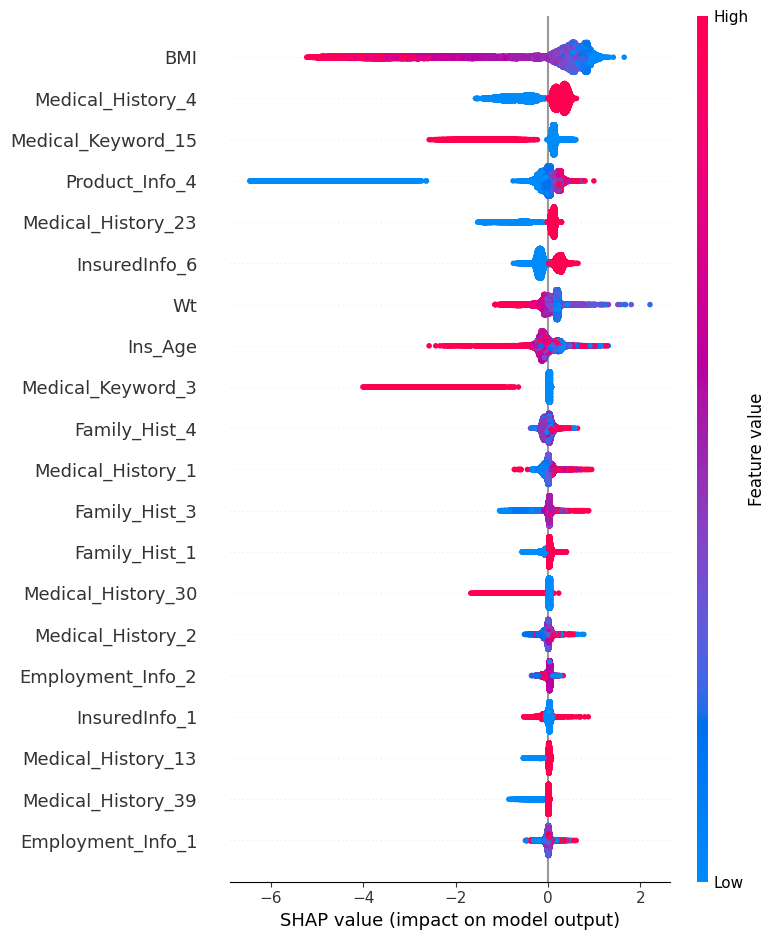

In [135]:
shap.summary_plot(shap_values_train_xgb,X_train,plot_type='dot')

In [136]:
explainer_test_xgb = shap.TreeExplainer(xgb_model)
shap_values_test_xgb = explainer_test_xgb.shap_values(X_test)

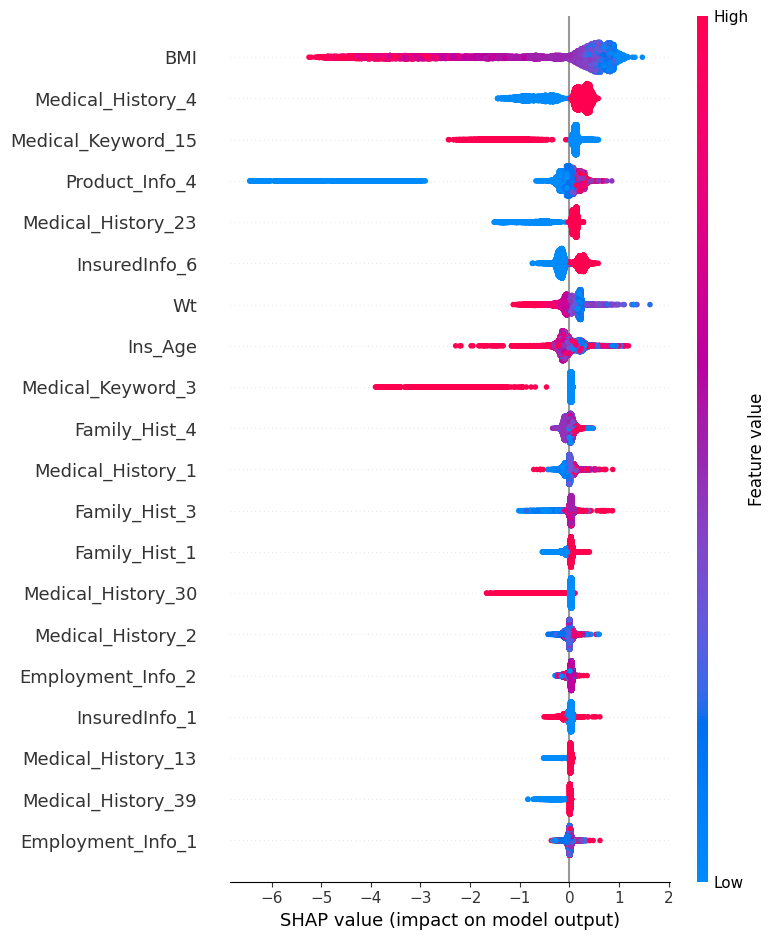

In [137]:
# Summary Plot
shap.summary_plot(shap_values_test_xgb,X_test,plot_type='dot')

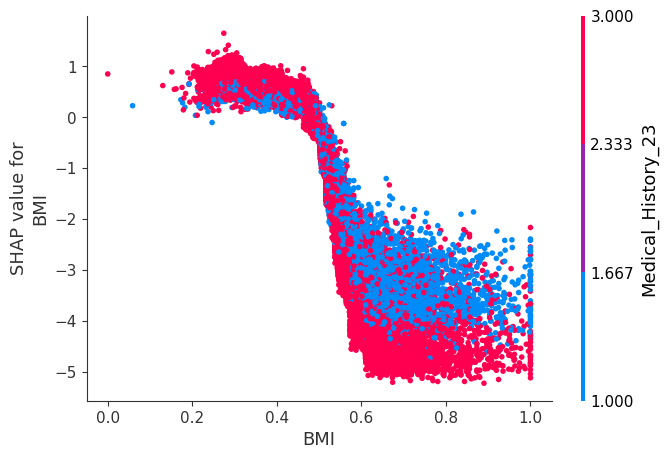

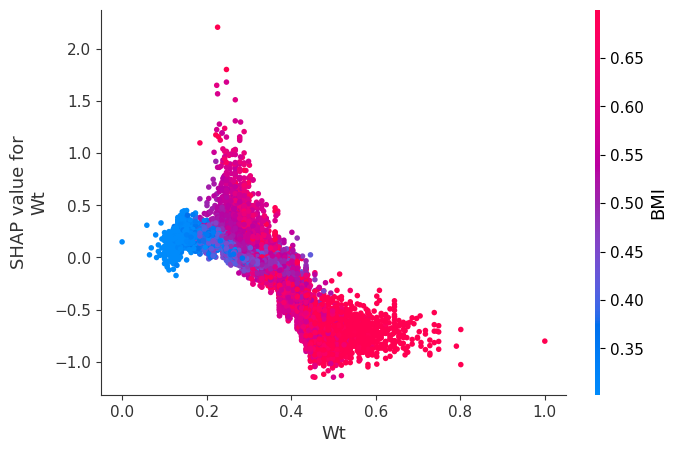

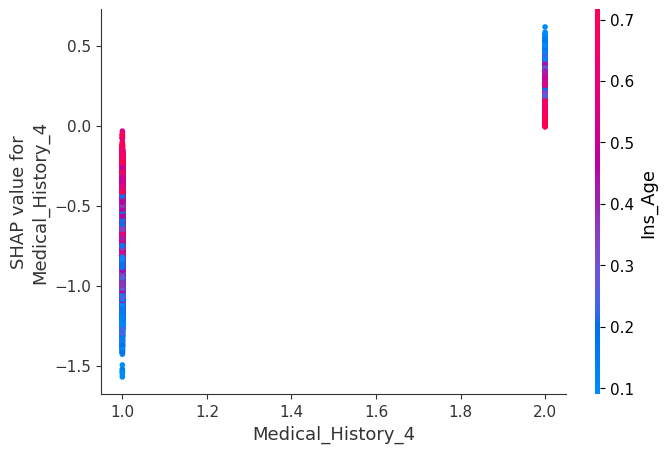

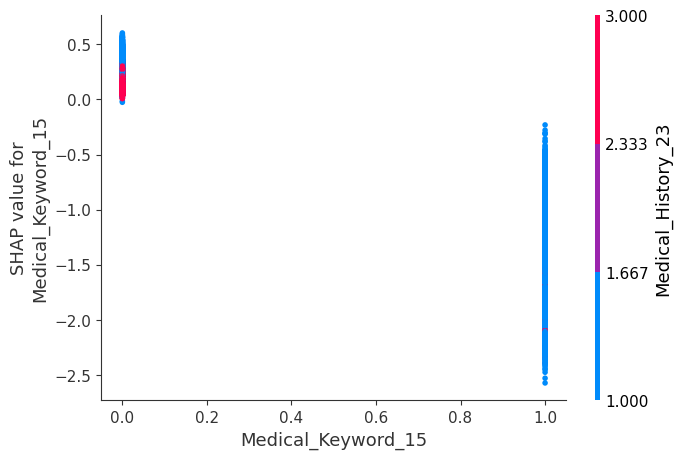

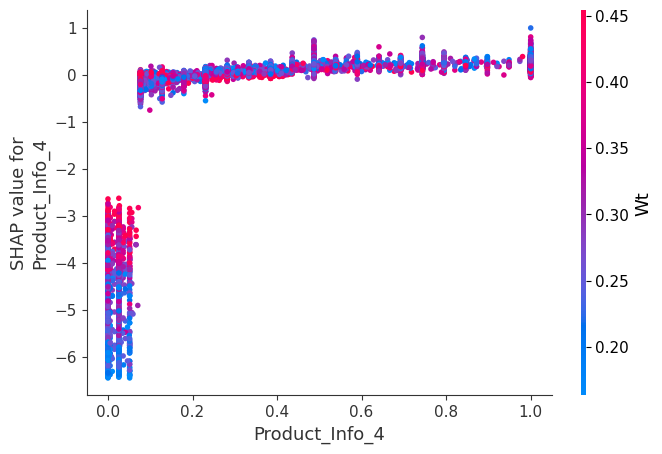

...

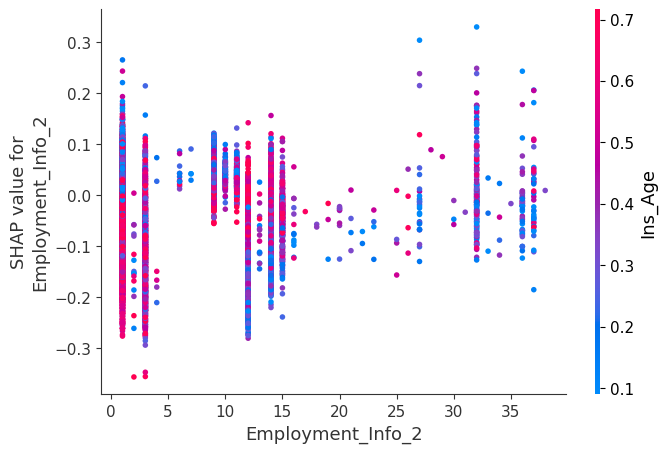

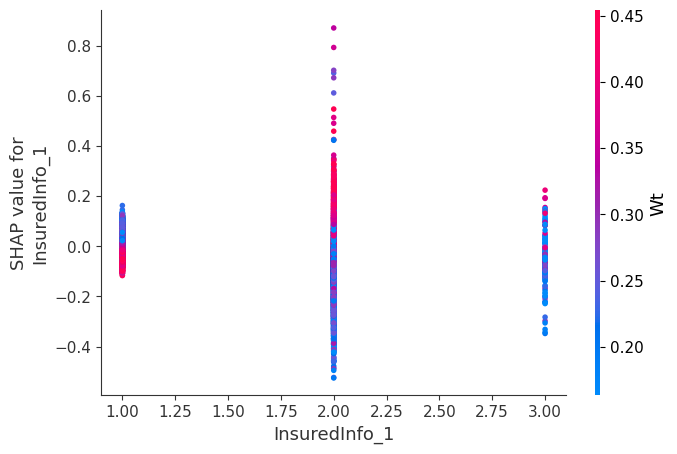

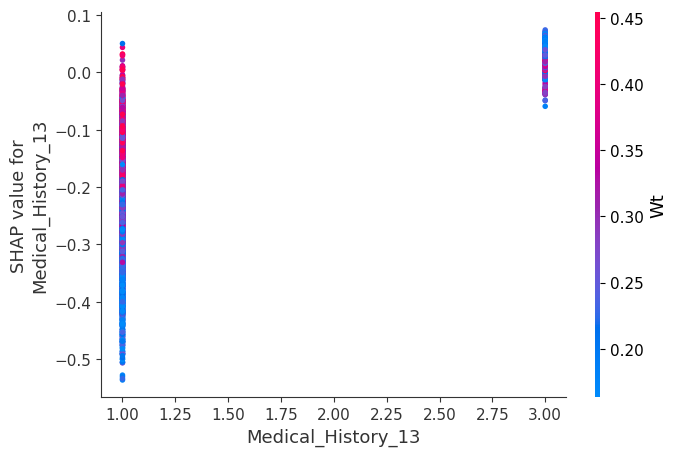

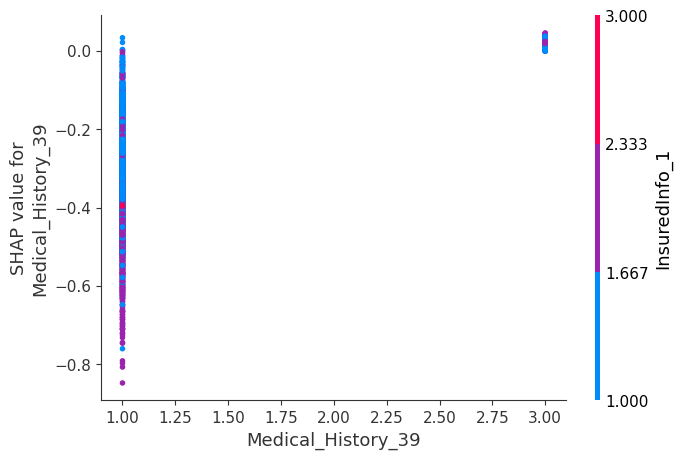

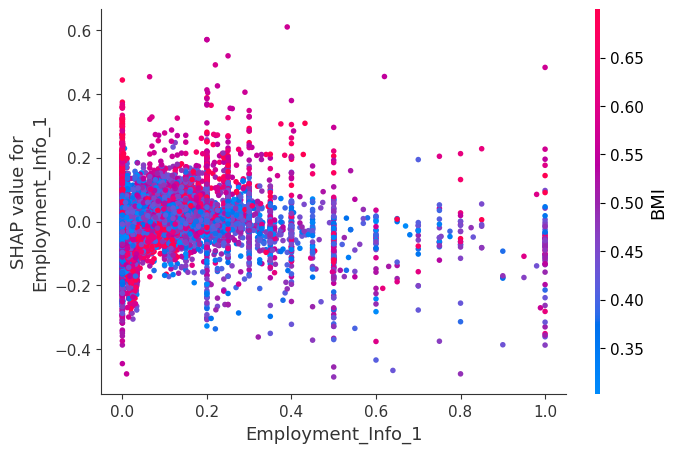

In [138]:
# Dependence Plot
top_vars = ['BMI', 'Wt','Medical_History_4','Medical_Keyword_15', 'Product_Info_4','Medical_History_23','InsuredInfo_6','Ins_Age','Medical_Keyword_3','Family_Hist_4','Family_Hist_3','Family_Hist_1',
            'Medical_History_1','Medical_History_30','Medical_History_2','Employment_Info_2','InsuredInfo_1','Medical_History_13','Medical_History_39','Employment_Info_1']
for elem in top_vars:
  shap.dependence_plot(elem, shap_values_train_xgb, X_train)

In [162]:
# Force Plot
shap.initjs()
shap.force_plot(explainer_train_xgb.expected_value, shap_values_train_xgb[:,0], X_train.iloc[:,0])